# assignment05
# Name: Sonjeongseol
# ID: 20155093

# Github link: https://github.com/wjdtjf1234/assignment01.git

# For this project, We should import some APis which will going to be used for image processing and plotting images first. 

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal
from skimage import io, color
from skimage import exposure

# Importing an image for the project.

In [2]:
file_image= '/Users/sonjeongseol/Desktop/cau.jpg'

# We will use this image in two ways, one with full color channels, while another with grayscale.

In [3]:
im_color = io.imread(file_image)
im_gray  = color.rgb2gray(im_color)

(-0.5, 1967.5, 1346.5, -0.5)

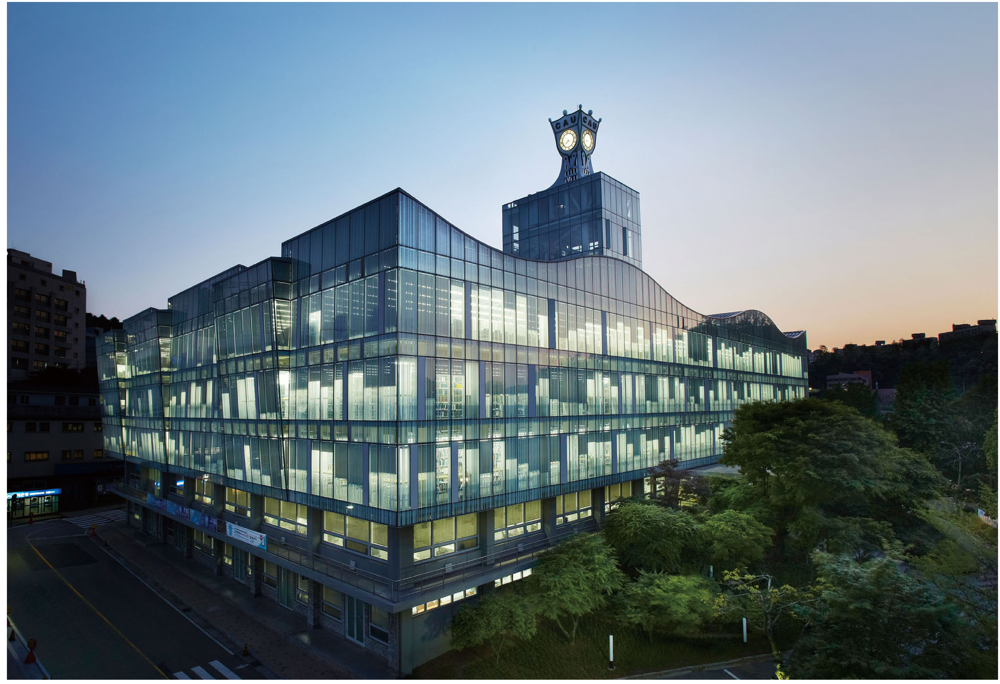

In [4]:
plt1=plt.subplots(1,1,figsize=(100,100))
plt.imshow(im_color)
plt.axis('off')

(-0.5, 1967.5, 1346.5, -0.5)

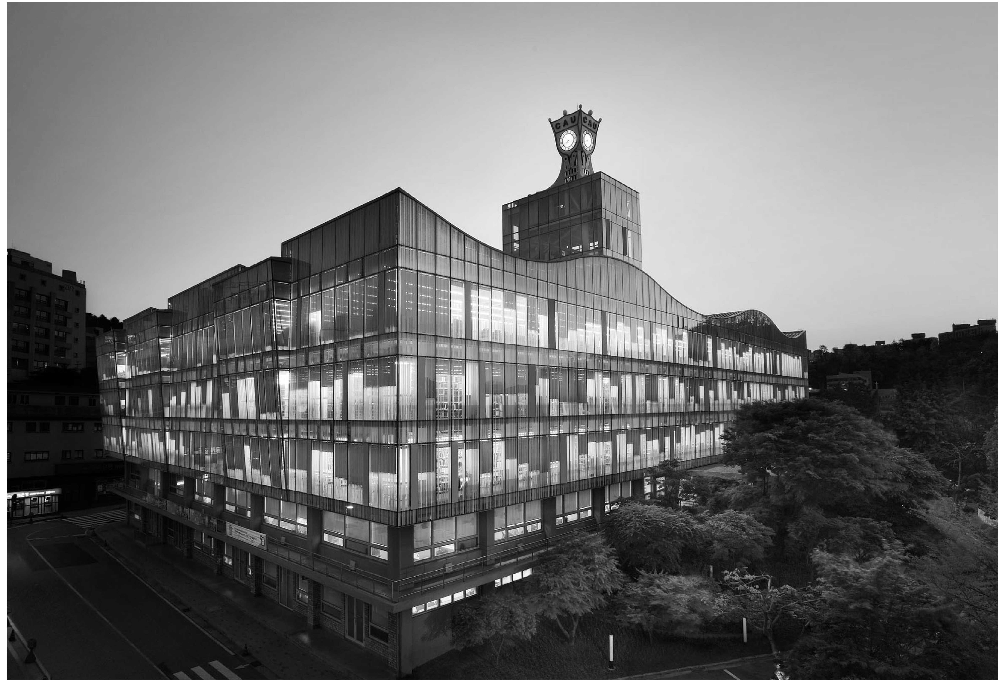

In [5]:
plt2=plt.subplots(1,1,figsize=(100,100))
plt.imshow(im_gray,cmap='gray')
plt.axis('off')

# For computing convolutions along x&y axes, we should define a kernel below. Since the first project is computing the image gradients, we define a kernel which can generate an image gradient vector through the operation.

In [6]:
ker_grad=np.array([[1,-1]])

# We can simply compute the convolution along the x-axis using a function named convolve2d(), but for the y-axis, we should transpose each matrix of r, g, b, and grayscale channels. 

In [7]:
im_tp0=[list(i) for i in zip(*im_color[:,:,0])]
im_tp1=[list(i) for i in zip(*im_color[:,:,1])]
im_tp2=[list(i) for i in zip(*im_color[:,:,2])]
im_gtp=[list(i) for i in zip(*im_gray)]

# Now, we first compute the gradients along the x-axis for each color channels. im_color[:,:,i] (i=0,1,2) and im_gray arrays present each single transpose vector for r/g/b/grascale color channels. 

In [8]:
im_conv0= signal.convolve2d(im_color[:,:,0],ker_grad,boundary='symm')
im_conv1= signal.convolve2d(im_color[:,:,1],ker_grad,boundary='symm')
im_conv2= signal.convolve2d(im_color[:,:,2],ker_grad,boundary='symm')
im_convg=signal.convolve2d(im_gray,ker_grad,boundary='symm')

# We should also compute the gradients along the y-axis too. We can compute them with im_tp0, im_tp1, im_tp2, and im_gtp. 

In [9]:
im_convt0=signal.convolve2d(im_tp0,ker_grad,boundary='symm')
im_convt1=signal.convolve2d(im_tp1,ker_grad,boundary='symm')
im_convt2=signal.convolve2d(im_tp2,ker_grad,boundary='symm')
im_convtg=signal.convolve2d(im_gtp,ker_grad,boundary='symm')

# Since the gradient value can be negative, we should change all negative values to positive, but with same absolute value.

In [10]:
im_conv0=np.absolute(im_conv0)
im_convt0=np.absolute(im_convt0)
im_conv1=np.absolute(im_conv1)
im_convt1=np.absolute(im_convt1)
im_conv2=np.absolute(im_conv2)
im_convt2=np.absolute(im_convt2)
im_convg=np.absolute(im_convg)
im_convtg=np.absolute(im_convtg)

In [11]:
x=len(im_conv0[:,0])
y=len(im_convt0[:,0])
im_g0=np.zeros((x,y),dtype=int)
im_g1=np.zeros((x,y),dtype=int)
im_g2=np.zeros((x,y),dtype=int)
im_g=np.zeros((x,y),dtype=int)
im_gr=np.zeros((x,y),dtype=float)
for i in range(x):
    for j in range(y):
        im_g0[i,j]=im_conv0[i,j]+im_convt0[j,i]
        im_g1[i,j]=im_conv1[i,j]+im_convt1[j,i]
        im_g2[i,j]=im_conv2[i,j]+im_convt2[j,i]
        im_g[i,j]=im_g0[i,j]+im_g1[i,j]+im_g2[i,j]
        im_gr[i,j]=im_convg[i,j]+im_convtg[j,i]
        j+1
    i+1


# Finally we finished computing total sum of gradients of r,g,b image matrices, which declared as an array, im_g, along the x and y axes. Now we can plot and see the boundaries of the image.

(-0.5, 1967.5, 1346.5, -0.5)

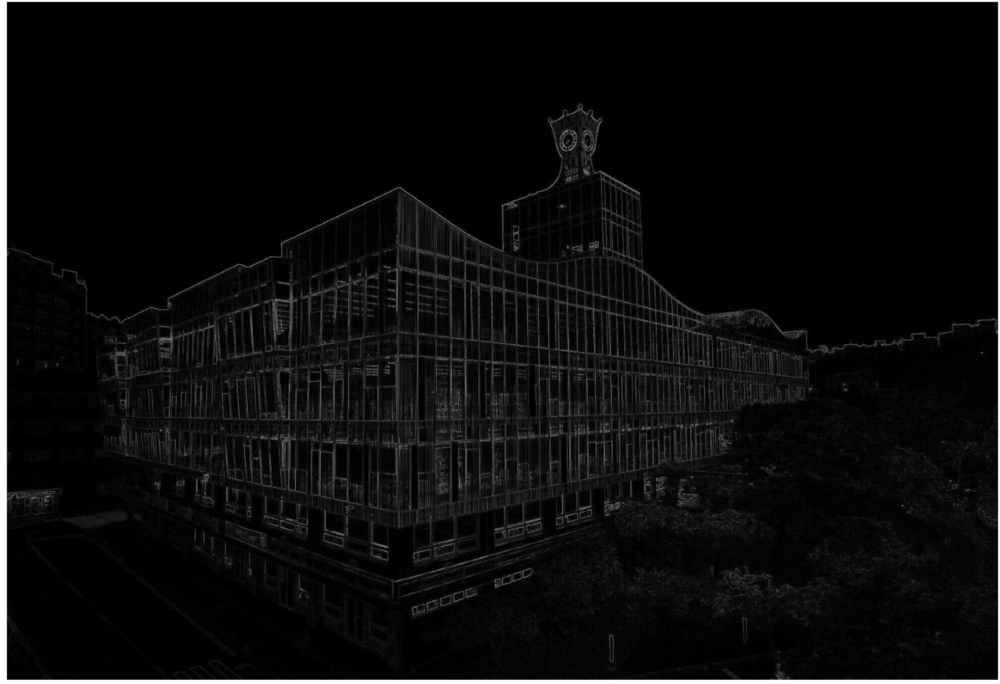

In [12]:
plt3=plt.subplots(1,1,figsize=(100,100))
plt.imshow(im_g,cmap='gray')
plt.axis('off')

(-0.5, 1967.5, 1346.5, -0.5)

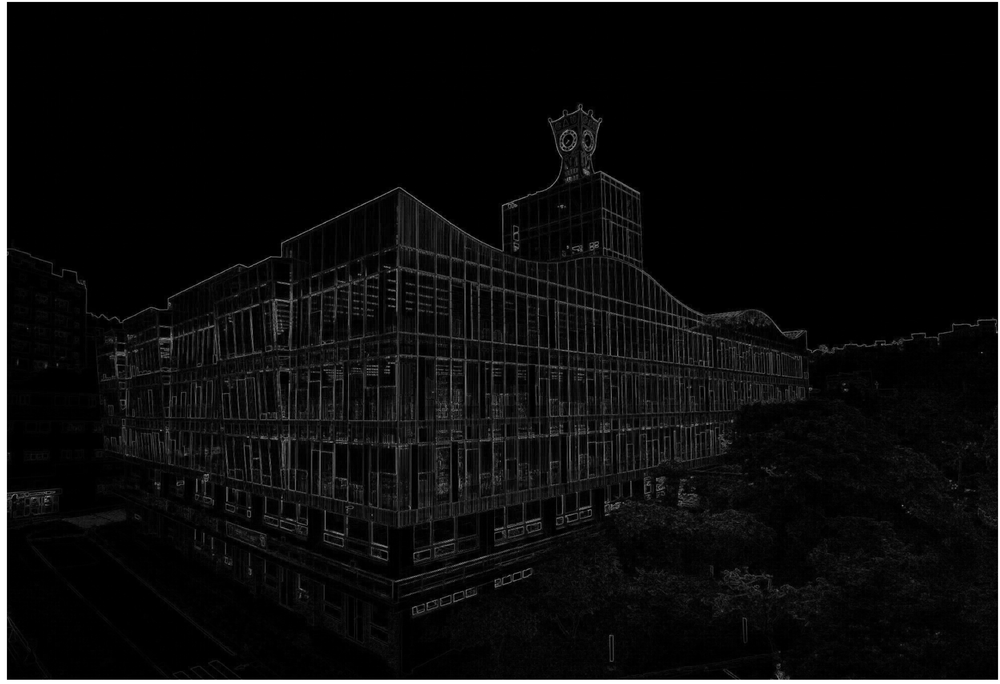

In [13]:
plt4=plt.subplots(1,1,figsize=(100,100))
plt.imshow(im_gr,cmap='gray')
plt.axis('off')

# The second project is smoothing the image with the smooting kernel. We should also define the kernel for the second project. 

In [14]:
ker=np.array([[3/11,2/11,1/11,2/11,3/11]])

#  Then we can smooth the grayscale image by computing the convolution between the image and smoothing kernel.

In [15]:
im_s= signal.convolve2d(im_gray,ker,boundary='symm',mode='same')

(-0.5, 1967.5, 1346.5, -0.5)

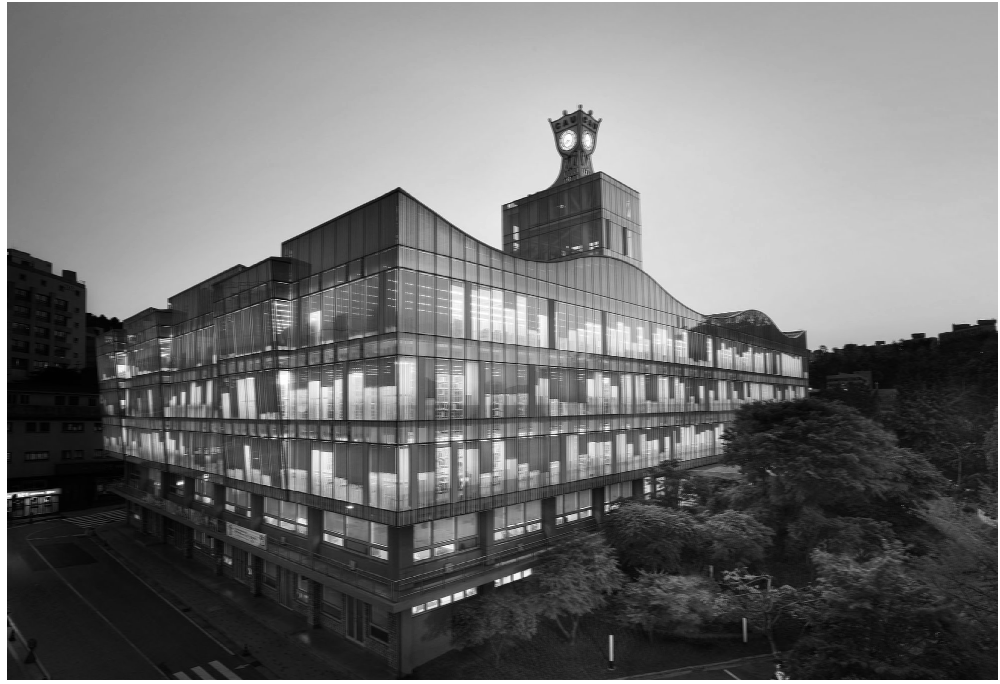

In [16]:
plt5=plt.subplots(1,1,figsize=(100,100))
plt.imshow(im_s,cmap='gray')
plt.axis('off')